# NIRISS/SOSS Reduction

This notebook will walk you through the basics of data analysis for NIRISS/SOSS.

In [ ]:
# First thing to do is set your CRDS variables so we can download the most up-to-date JWST 
# reference files. 

import os
os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

Now let's get some data! exoTEDRF has a useful functionality which allows you to automatically grab any (public) data from the MAST archive.  
Let's use the WASP-39b transit observations from the JWST Transiting Exoplanet Community Early Release Science program published in [Feinstein, Radica et al. (2023)](https://ui.adsabs.harvard.edu/abs/2023Natur.614..670F/abstract).

In [ ]:
from exotedrf.extra_functions import download_observations

# We want all data associated with proposal ID 1366 for target WASP-39b. Additionally we 
# specify NIRISS/SOSS since this program also observed the same planet with NIRSpec and NIRCam. 
# Lastly, we want both the usual CLEAR observations as well as those using the F277W filter, 
# which restricts the SOSS wavelength range to >2.5µm. 

download_observations(proposal_id='1366', objectname='WASP-39b', instrument_name='NIRISS/SOSS',
                      filters=['CLEAR', 'F277W'])

# This will store all files in a folder in the present directory called DMS_uncal.

Now let's create output directories to store our data products.

In [ ]:
from exotedrf import utils

# Generate output directories
utils.verify_path('pipeline_outputs_directory')
utils.verify_path('pipeline_outputs_directory/Stage1')
utils.verify_path('pipeline_outputs_directory/Stage2')
utils.verify_path('pipeline_outputs_directory/Stage3')
utils.verify_path('pipeline_outputs_directory/Stage4')

exoTEDRF is subdivided into four stages, mirroring the STScI jwst pipeline.  
The stages are as follows:
 - Stage 1: Detector Level Processing 
 - Stage 2: Spectroscopic Processing
 - Stage 3: 1D Spectral Extraction
 - Stage 4: Light Curve Fitting 
 
This notebook will walk you through stages 1 to 3, or from raw data to extracted stellar spectra, mostly following the steps laid out in [Radica et al. (2023)](https://ui.adsabs.harvard.edu/abs/2023MNRAS.524..835R/abstract). 

## Stage 1 -- Detector-Level Processing

Stage 1 performs multiple important calibrations on the raw, 4D (integrations, groups, y-pixel, x-pixel) data cubes. A few steps are simply wrappers around the existing functionalities of the STScI pipeline, whose documentation can be found [here](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_detector1.html).

In [ ]:
from exotedrf import stage1

# First define some input and output directory paths.

uncal_indir = 'DMS_uncal/'  # Where our uncalibrated files are found. 
outdir_s1 = 'pipeline_outputs_directory/Stage1/'  # Where to save our Stage 1 output files.

Now let's make a list with all the uncal input files. Here we're only concerned with the CLEAR exposure files, and not the F277W filter ones.  
In this case, the full TSO is broken up into four segments.

In [ ]:
filenames = [uncal_indir+'jw01366001001_04101_00001-seg001_nis_uncal.fits', 
             uncal_indir+'jw01366001001_04101_00001-seg002_nis_uncal.fits',
             uncal_indir+'jw01366001001_04101_00001-seg003_nis_uncal.fits',
             uncal_indir+'jw01366001001_04101_00001-seg004_nis_uncal.fits']

Let's check the readout pattern of the observations. 

In [6]:
from astropy.io import fits

with fits.open(filenames[0]) as file:
    print('No. integrations: {}'.format(file[0].header['NINTS']))
    print('No. groups: {}'.format(file[0].header['NGROUPS']))
    print('subarray: {}'.format(file[0].header['SUBARRAY']))

No. integrations: 537
No. groups: 9
subarray: SUBSTRIP256


Here we can see that the full TSO consists of 537 integrations, with 9 groups per integration using the 256 x 2048 pixel subarray, which provides the full 0.6 -- 2.8µm wavelength range. 

Let's now take a look at what the raw data looks like.

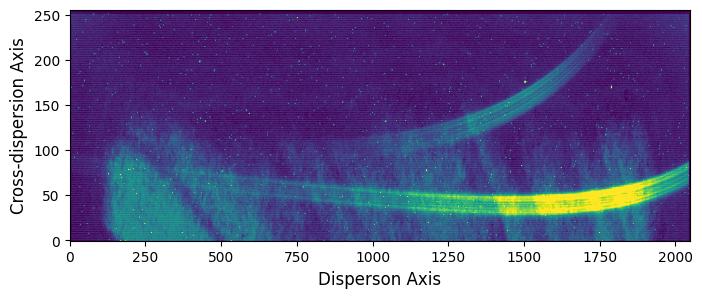

In [7]:
import matplotlib.pyplot as plt

with fits.open(filenames[0]) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',  
               vmin=1e4, vmax=3e4)
    plt.xlabel('Disperson Axis', fontsize=12)
    plt.ylabel('Cross-dispersion Axis', fontsize=12)
    plt.show()

We can clearly see the first (lower) and second (upper) orders of the target spectrum, as well as a number of nasty detector effects! 

Next, let's make sure that the observations were successful (i.e., we actually observed a transit).

2025-12-04 17:06:12.476 - exoTEDRF - INFO - Reading file DMS_uncal/jw01366001001_04101_00001-seg001_nis_uncal.fits.
2025-12-04 17:06:14.102 - exoTEDRF - INFO - Reading file DMS_uncal/jw01366001001_04101_00001-seg002_nis_uncal.fits.
2025-12-04 17:06:21.639 - exoTEDRF - INFO - Reading file DMS_uncal/jw01366001001_04101_00001-seg003_nis_uncal.fits.
2025-12-04 17:06:23.375 - exoTEDRF - INFO - Reading file DMS_uncal/jw01366001001_04101_00001-seg004_nis_uncal.fits.


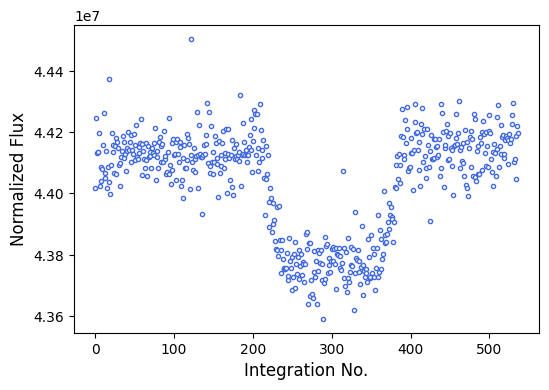

In [8]:
from exotedrf.plotting import plot_quicklook_lightcurve

# Make a quick a dirty light curve plot.
plot_quicklook_lightcurve(filenames)

Looks good! The transit is nicely centered in the time series, and we can already see it clearly even in the raw data! Ingress appears to be around integration 200, and egress at 400. Let's keep those values in mind to use later. 

We're now ready to start with the actual reduction.

### DQ Initalization Step
Intializes the data quality flags and flags saturated pixels.  

In [ ]:
# Initialize the step by passing the input files and the directory to which we want to save the outputs. 
# There's also an option to pass a custom hot pixel map in order to identify and flag hot pixels which are 
# not already in the default data quality map. This should be a boolean map with True  values for hot 
# pixels and False otherwise. A version of this is output by the BadPixStep towards the end of Stage 2. 

step = stage1.DQInitStep(filenames, hot_pixel_map=None, output_dir=outdir_s1)

# Now run the step! 
# This step has options for diagnostic plotting. Specifying do_plot=True will create the step plot and save it to 
# the output directory.
# If you want to change the saturation threshold, you can do so by passing a value (in percent of full well) to the 
# saturation_threshold keyword. If not, an instrument-dependent default value will be used.

results = step.run(save_results=True, force_redo=True, do_plot=True)

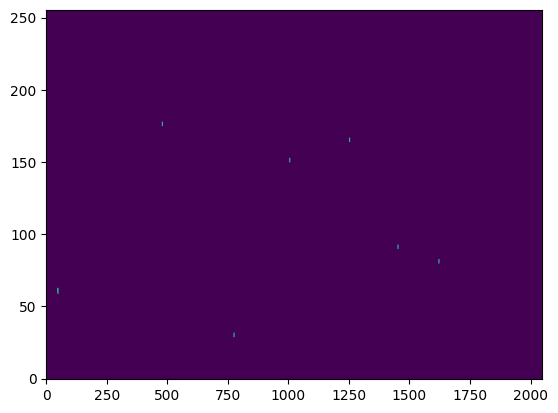

In [10]:
# Display the step plot.

from IPython.display import Image

Image(filename=outdir_s1 + 'dqinitstep.png') 

Here we can see a map of all saturated pixels in a frame of the observations. There are only a small handful --- mostly just due to known hot pixels. So nothing that really needs to be worried about!

### INL Correction Step
Removes the integral nonlinearity (INL) from NIRISS data frames. The INL effect was first noted in the SOSS mode by [Dholakia et al. (2026)](https://ui.adsabs.harvard.edu/abs/2026arXiv260611983D/abstract), after it's analysis by [Desdoigts et al. (2025)](https://ui.adsabs.harvard.edu/abs/2025arXiv251009806D/abstract) in the NIRISS AMI mode. Essentially, there is a periodic noise signal (periodic in ADU, not in time) injected into the data by the NIRISS amplifiers. Luckily, the INL frequency is well-known and can be corrected by removing Fourier Series at the dominant periodicity of 1024 ADU and it's harmonics. The correction carried out here roughly follows that developed by Dholakia et al. (2026) and uses the Fourier coefficients derived in that work. However, different coefficients and/or periodicities can be supplied to this step if necessary using the ```amplitude_file``` and ```periods``` keywords.

In [ ]:
# This time we pass the outputs from the previous step as the inputs for this step.

step = stage1.INLCorrStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

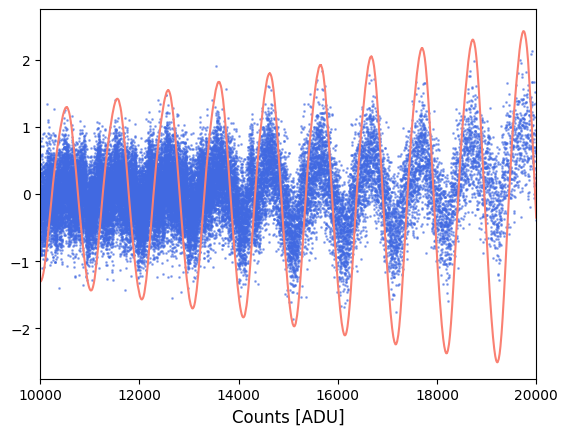

In [2]:
Image(filename=outdir_s1 + 'inlcorrstep_1.png') 

Here we get two step plots. The first visualizes the INL signal itself (blue) as well as the correction (in red). 

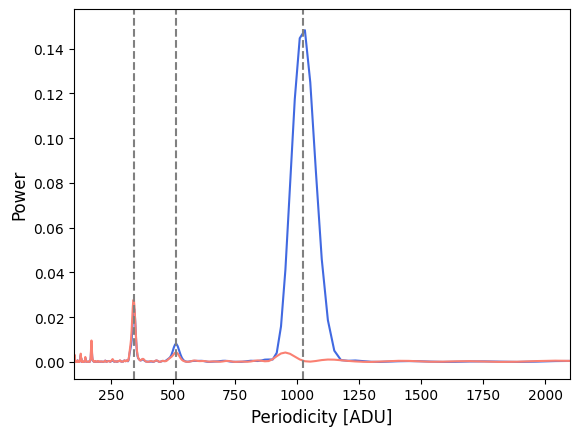

In [3]:
Image(filename=outdir_s1 + 'inlcorrstep_2.png') 

The second step plot shows a power series of the data before (blue) and after (red) applying the INL correction. We can see that there is a strong periodicity at 1024 ADU initially, which is entirely removed after the INL correction is applied. Power at the first and second harmonics are also reduced by this correction.

### Superbias Subtraction Step
Now we subtract the superbias level from all frames.  

<div class="alert alert-block alert-info"> <b>NOTE:</b> When running the Superbias Correction with the direct outputs of a previous step (i.e., with save_results=False) a specific error may occur: <br>
   <code>UFuncTypeError: Cannot cast ufunc 'subtract' output from dtype('float32') to dtype('uint16') with casting rule 'same_kind'. </code> <br>
This likely stems from a crds reference file compatability issue, and is being looked into. In the mean time, a workaround is to simply create a list of paths to the previous step output files, e.g., <br>
    <code> results = ['XXXX_seg001_inlcorrstep.fits', 'XXXX_seg002_inlcorrstep.fits', ...]</code> <br>  
and pass this to the SuperBiasStep.</div>

In [ ]:
step = stage1.SuperBiasStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

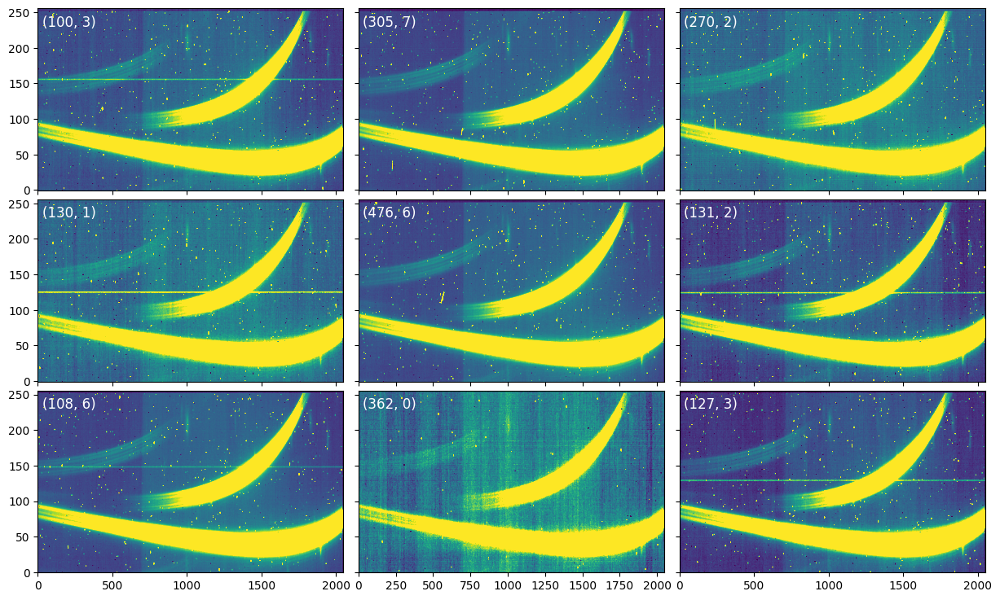

In [12]:
Image(filename=outdir_s1 + 'superbiasstep_1.png') 

Nine random frames are shown in the diagnostic plot, where we can verify that many of the detector effects we saw above, including the bright clouds at the bottom of the frame are now gone.

### Reference Pixel Correction Step
This is a wrapper around an existing STScI pipeline step, whose main purpose was to correct time-correlated 1/f noise by using reference pixels. However, SOSS only has four rows of reference pixels at the top of the frame, and so this step actually does not do a very good job of correcting the 1/f noise! However, it is useful to remove integration-to-integration bias variations as well as odd-even row effects.

In [ ]:
step = stage1.RefPixStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

### Dark Current Subtraction Step
Another wrapper around an STScI pipeline step. This one is optional, and many analyses skip it as the existing dark current reference files show clear residual 1/f noise. Moreover, particularly for NIR observations, the actual dark current signal is extremely small. However, I include it here for completeness!

In [ ]:
step = stage1.DarkCurrentStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

### 1/f Noise Correction Step
1/f noise is time-correlated noise which manifests in SOSS observations as column-correlated "stripes". The 1/f noise is actually caused by time-varying voltage levels as the detector is read, and as such it is actually one of the very last noise sources (along with read noise) to be injected into the data. exoTEDRF, therefore, corrects 1/f noise at the group-level (i.e., before ramp fitting) as is done with the other JWST instrument modes.  

1/f noise correction can also be done at the integration-level (i.e., after ramp fitting) in addition to, or instead of the group-level correction if you wish. In which case, feel free to skip this step! However, keep in mind that a group-level 1/f correction is better and leads to more accurate results and lower noise levels ([Carter et al. 2025](https://ui.adsabs.harvard.edu/search/fq=%7B!type%3Daqp%20v%3D%24fq_database%7D&fq_database=(database%3Aastronomy%20OR%20database%3Aphysics)&p_=0&q=Effects%20of%20Jump%20Detection%20and%20Ramp%20Fitting%20Algorithms%20on%20NIRISS%2FSOSS%20Exoplanet%20Time-Series%20Observations&sort=date%20desc%2C%20bibcode%20desc)).

#### First Background Subtraction
For reasons outlined more completely in [Feinstein, Radica et al. (2023)](https://ui.adsabs.harvard.edu/abs/2023Natur.614..670F/abstract) and [Radica et al. (2023)](https://ui.adsabs.harvard.edu/abs/2023MNRAS.524..835R/abstract), the SOSS background signal **must** be subtracted before attempting the 1/f noise correction. Here, we do a group-level background subtraction --- that is we subtract a background signal separately from each group. 

Technically the background signal needs to be corrected for flat field, and linearity effects (amongst other things) which we have not yet done. We'll therefore be adding the background signal back to the data after the 1/f noise correction.

The SOSS background has a unique structure caused by the undispersed light from the zodiacal background falling off the JWST pick-off mirror. STScI has created a model of the SOSS background which can be found [here](https://github.com/radicamc/exoTEDRF/tree/main/files). Download the file for the subarray used in your observations (in this case SUBSTRIP256).

Note that STScI has also conducted a calibration program to take a sample of on-sky dithered backgrounds with different pointings. These are contained in the jwst_niriss_bkg_XXXX.fits crds reference files, which can be used in a similar way to the original background model. However, the backgrounds contained in this file are noisier and still contain bad pixels --- so we'll stick with the original model.

In [ ]:
from exotedrf.extra_functions import download_ref_file

# Download the background model file. 
# Note: there is a seperate file for SUBSTRIP256 and SUBSTRIP96 (the bright star subarray) observations. 
# Make sure you use the correct one for your observations!
# In this case the observations use SUBSTRIP256.

filename = 'model_background256.npy'  # File to download.
url = 'https://raw.githubusercontent.com/radicamc/exoTEDRF/main/files/'  # Host url.
outdir = './'  # Local directory to which to save the file.
    
download_ref_file(filename, url, outdir)

In [ ]:
# Open the STScI background model.

import numpy as np

background_model_path = './model_background256.npy'  # Edit to point to the download location

background_model = np.load(background_model_path)

Let's see what the background model looks like.

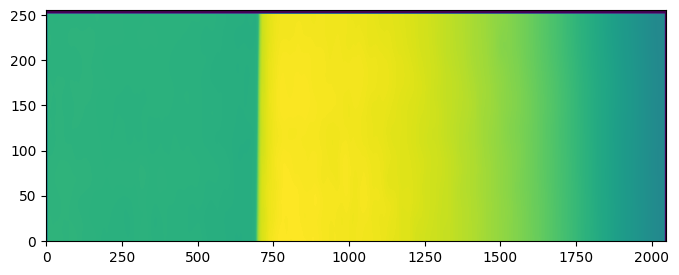

In [17]:
plt.figure(figsize=(8, 3))
plt.imshow(background_model, aspect='auto', origin='lower')
plt.show()

There's clearly a sharp increase in the background level at pixel ~700 caused by the zodi order 0 suddenly falling off the pick-off mirror. The background level slowly decreases towards the right.

Let's now subtract the SOSS background.

In [ ]:
# The background correction step technically lives within Stage 2 of exoTEDRF.

from exotedrf import stage2

# In addition to the input files and output directory, we also want to pass the background model
# that we opened above, as well as an estimate of the integrations which define the transit 
# baseline. From our quick look light curve above, the first 150 and last 100 are reasonable.

step = stage2.BackgroundStep(results, background_model=background_model, 
                             baseline_ints=[150, -100], output_dir=outdir_s1)

# Specifying differential=True allows for the background model to be scaled separately to the 
# right and left of the "step" at pixel ~700 (recommended). Note, however, that for SUBSTRIP96 
# observations (the bright star subarray) this functionality is not supported.

results, bkg = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)

This step will produce two diagnostic plots. The first, once again, shows nine random frames, but now with the background subtracted. The increase in brightness at column ~700 that we saw after the superbias subtraction has nicely been removed. In some cases (like here), we can even see evidence for the 1/f striping!

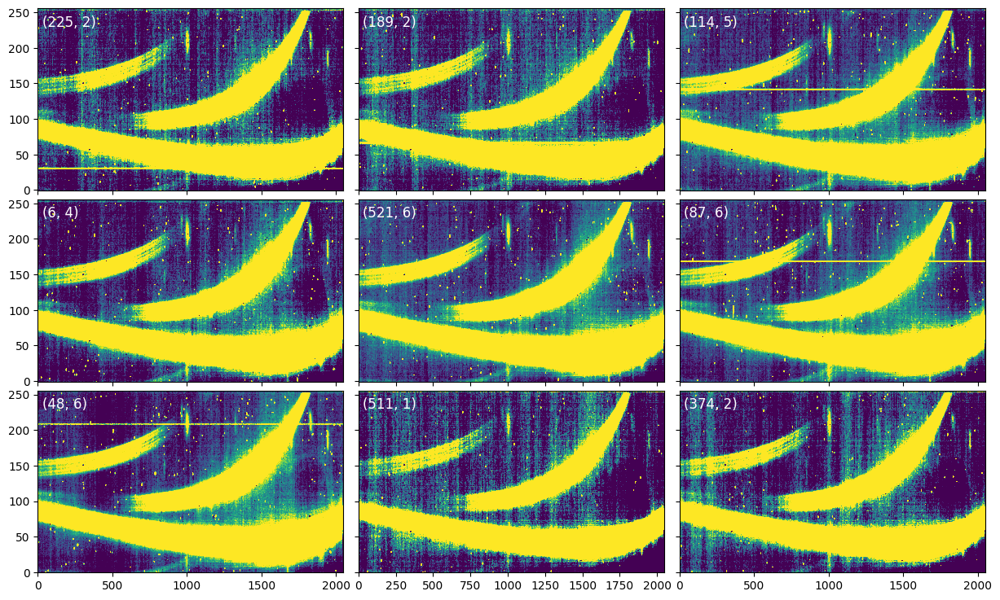

In [19]:
Image(filename=outdir_s1 + 'backgroundstep_1.png') 

The second plot shows a cut along a detector row at the top of the detector to better visualize the background removal. 

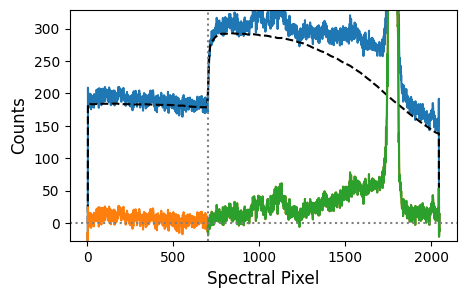

In [20]:
Image(filename=outdir_s1 + 'backgroundstep_2.png') 

Recently, it has been suggested to take dedicated dithered background observations for each SOSS TSO, such that one would have on-sky backgrounds and wouldn't need to rely on a model. You can certainly go this route if you wish. However, a STScI report from [Baines et al. (2025)](https://www.stsci.edu/files/live/sites/www/files/home/jwst/documentation/technical-documents/_documents/JWST-STScI-009046.pdf) concluded that the differential background scaling implemented here performs just as well as a dedicated background observation across all their tests. So if you do not wish to (or did not) include a dedicated background exposure in your observations, don't worry about affecting the quality of your data. 

#### 1/f Noise Correction
We can now proceed with the correction of the 1/f noise itself. 

exoTEDRF provides four different methods for 1/f correction, but we'll proceed with the simplest one, "scale-achromatic", here. It simply consists of constructing difference images by subtracting a median stack from each individual frame, and subtracting the median value from each column. 

Since SOSS is slitless, background stars can contaminate the frame, and potentially bias the 1/f noise estimation.
It's therefore important to exclude any contaminated pixels from this calculation. Luckily, the F277W exposure, which is one of the optional data products included in some obervsations, can help here. If you have a F277W exposure, the OneOverFStep can use it to automatically locate and mask contamination. This is why we downloaded the F277W exposure files in the first place!

That F277W data was obviously just the raw data, but it can be calibrated in much the same way as the CLEAR data that we have been working with --- just much more quickly. In fact, exoTEDRF has a utility funcationality to due this on in one step: ```stage1.reduce_f277w_exposure```. However, to speed things up even more, you can find an already-calibrated version of the WASP-39b F277W exposure [here](https://github.com/radicamc/exoTEDRF/tree/main/docs/content/data).

Let's open the F277W exposure and see what it looks like.

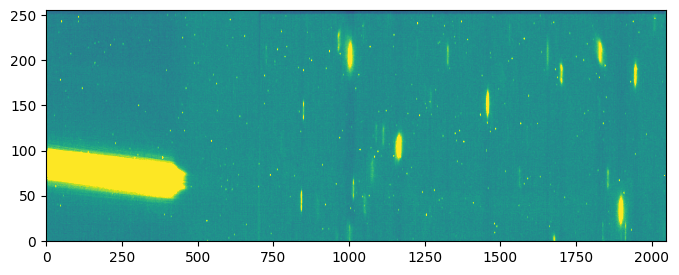

In [21]:
# Open the F277W exposure.

f277w_path = '../data/F277W.npy'  # Or edit this path to point to where your F277W exposure is located locally.
f277w_frame = np.load(f277w_path)  

# Now let's display it!

plt.figure(figsize=(8, 3))
plt.imshow(f277w_frame, aspect='auto', origin='lower', vmin=-1, vmax=1)
plt.show()

Only the reddest end of the target order 1 spectral trace is transmitted by the F277W filter, and so all of the background star contaminants are revealed! Every splotch above is the undispersed 0th order of a background star which was within the field of view of the target during the observation. This is why it's a good idea to judiciously choose your appropriate APAs when planning NIRISS/SOSS observations!

It's even possible to have dispersed contaminats present on the detector, and there is actually a very faint one in this dataset! But these most likely won't show up in the F277W exposure. 

You also might want to manually mask certain pixels which are contaminated for other reasons, or if there is no F277W exposure for your particular dataset. In this case, you can create your own set of pixel masks. These should be boolean arrays with False for "good" pixels and True for pixels to be masked. These custom masks should be the shape of a single data frame (i.e., 256x2048 for SOSS SUBSTRIP256) in which case these pixels will be masked in the whole dataset. Alternatively, you can create a different mask for each integration, if you want to mask different pixels. These masks should then be passed to the ```pixel_masks``` keyword.

In [ ]:
pixel_masks = None

# We have no custom masks, so we're going to pass None here.

For the scale-achromatic method, it is also a good idea to pass an estimate of the planet's white light curve. This is so that the median stack can be scaled to the average flux level of each frame before being subtracted.  
Again, if no such estimate is available, the light curve will be estimated from the current data. A version of this file is created during the PCAReconstructStep in Stage2.

In [ ]:
timeseries = None

# If available, the exoTEDRF timeseries estimate file will have the name XXX_lcestimate.npy.

In [ ]:
# Initialize the step passing the input files as well as any auxiliary files mentioned above.
# We also want to indicate the indices of the baseline integrations and the 1/f correction method that 
# we want to use. 
# We're also passing the F277W filter exposure here so that background contaminants are masked. 
# Lastly, we also pass the background model from the BackgroundStep so that it can be re-added. 


step = stage1.OneOverFStep(results, baseline_ints=[150, -100], output_dir=outdir_s1, 
                           pixel_masks=pixel_masks, soss_timeseries=timeseries,
                           method='scale-achromatic', soss_background=bkg, f277w=f277w_path)

# even_odd_rows=True calculates seperate 1/f noise values for even- and odd-values rows. This is likely 
# taken care of adequately by the RefPixStep above, but it can't hurt to do it again!
# inner_mask_width=40 defines the width of pixels around the target spectral trace to mask. It's a good
# idea to make this at least as large as your planned extraction aperture. 

results = step.run(save_results=True, even_odd_rows=True, force_redo=True, do_plot=True, 
                   soss_inner_mask_width=40)

At least three diagnostic plots are produced here (depending on the method). The first will always be our familiar nine-panel plot, now showing difference images after the 1/f noise correction. We don't want to see any column-correlated noise left here!

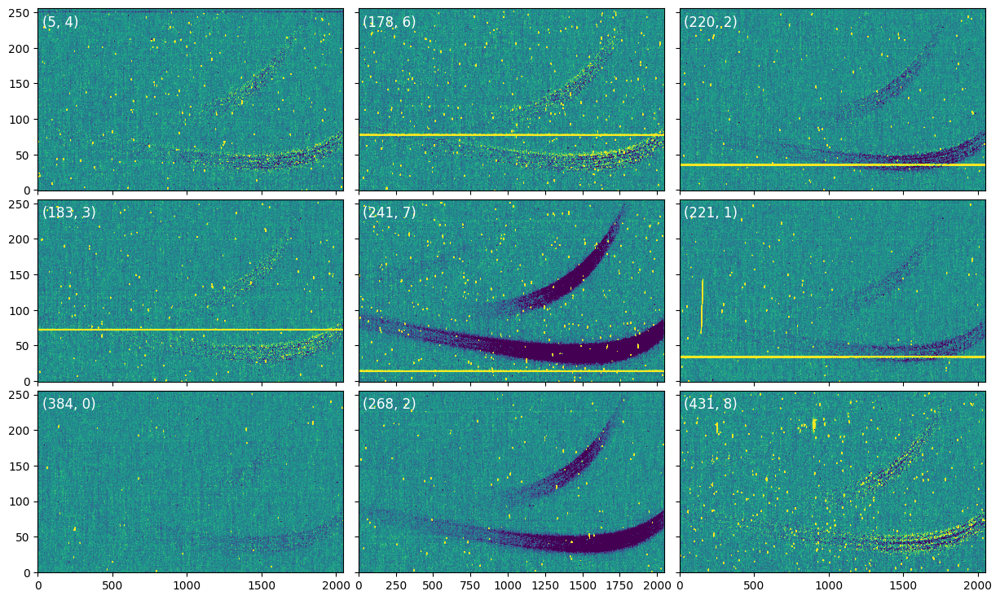

In [51]:
Image(filename=outdir_s1 + 'oneoverfstep_1.png') 

The second is a power series of the data before and after the 1/f correction. The power spectral density before the correction clearly increases, roughly linearly, towards shorter frequencies (hence 1/f!). After the correction though, we can see that the psd is much flatter. We have done a pretty good job of removing all the 1/f noise!

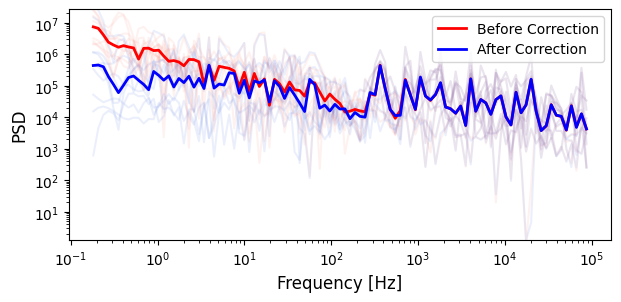

In [26]:
Image(filename=outdir_s1 + 'oneoverfstep_2.png') 

Finally, we have a map of the pixels masked due to background contamination compared to the F277W exposure. Here, we can see that all undispersed contaminants in the F277W are successfully masked. 

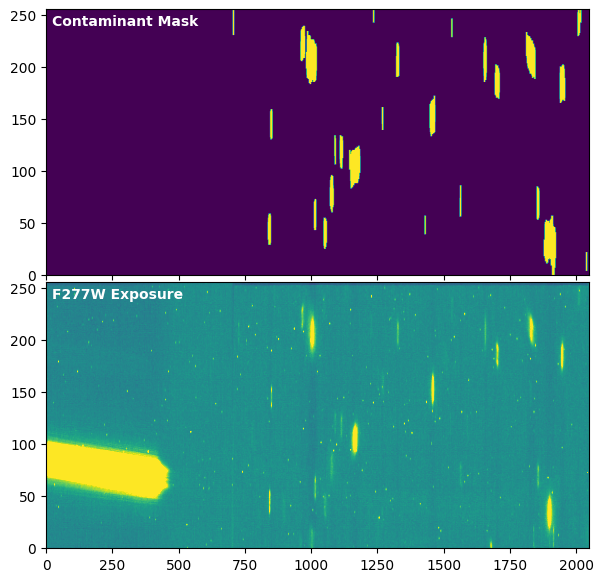

In [27]:
Image(filename=outdir_s1 + 'contminant_mask.png') 

<div class="alert alert-block alert-info"> <b>NOTE:</b> If running the OneOverFStep at the integration level, don't pass anything to the background keyword so that the background is not unnecessarily re-added to the data. </div>

### Linearity Step
The HgCdTe detectors used in NIRISS are not perfectly linear, which means that as saturation is approached, the counts begin to plateau and less flux is recorded than is actually observed. This is not an issue just with NIRISS, but all other JWST instruments as well. This step applies pre-calcuated polynomials to correct these non-linearity effects in the ramp. 

In [ ]:
step = stage1.LinearityStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

The first diagnostic plot shows (mean-subtracted) group-to-group differences. For a perfect non-linearity correction, we would expect each difference to be identical. The correction is therefore not perfect, but it's much better than where we started!

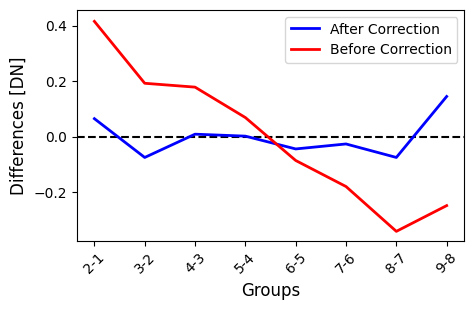

In [29]:
Image(filename=outdir_s1 + 'linearitystep_1.png') 

The second plot shows the residuals to a perfectly straight ramp before and after correction. before the correction, we see large positive residuals at intermediate group numbers, indicating that the ramp is indeed plateauing. We're much better, but again not perfect, after the correction.

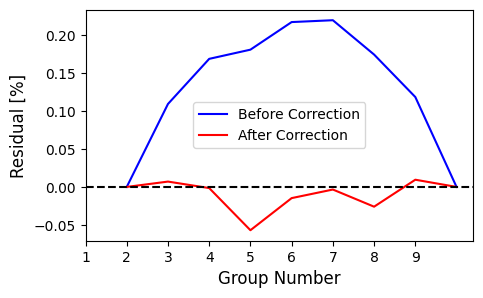

In [30]:
Image(filename=outdir_s1 + 'linearitystep_2.png') 

### Jump Detection Step
We now want to detect and flag cosmic ray hits in the data. There are two main ways to do this: up-the-ramp or time-domain flagging. 

The up-the-ramp flagging algorithm is the default algorithm in the STScI pipeline. In entails identifying discontinuities above a certain threshold in ramps, and flagging these as jumps. Unfortunately, this method can be quite temperamental and has been found by many studies to flag random noise. It also cannot be applied to ngroup=2 datasets (which are reasonably common with NIRISS/SOSS!)

The time-domain flagging method uses a sigma clipping algorithm to identify cosmic ray hits in the time domain. This method also has the benefit of working for observations with any number of groups. 

In [ ]:
step = stage1.JumpStep(results, output_dir=outdir_s1)

# Here we will use the time-domain rejection by specifying flag_in_time=True, and use a clipping 
# threshold of 7 sigma.
# In order to use the up-the-ramp flagging, specify instead flag_up_ramp=True and pass an 
# appropriate value to the rejection_threshold keyword. 

results = step.run(save_results=True, force_redo=True, flag_in_time=True, 
                   time_rejection_threshold=7, do_plot=True)

The diagnostic plot here shows the locations of flagged jumps, as well as hot pixels in nine frames. 

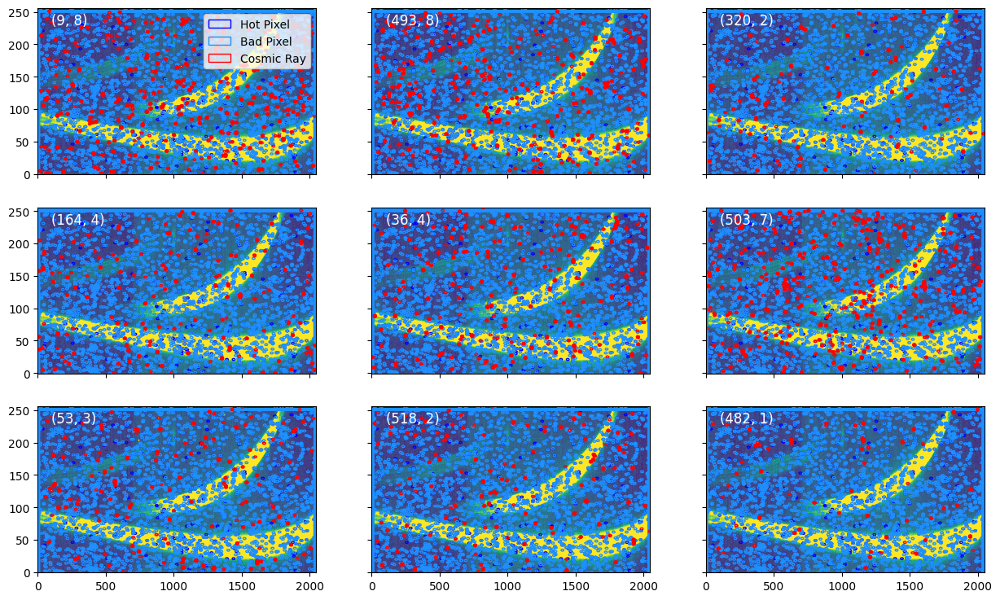

In [32]:
Image(filename=outdir_s1 + 'jump.png') 

### Ramp Fit Step
Now that all the initial detector-level calibrations are done, we are ready for ramp fitting! This step is a wrapper around the STScI pipeline step that fits a slope and intercept as a function of group to each pixel. We don't use the intercept values, and only care about the slopes moving forwards.

In [ ]:
step = stage1.RampFitStep(results, output_dir=outdir_s1)

# This step has multiprocessing capabilities. You can choose how many CPU cores to use via the
# maximum_cores keyword. Feel free to adjust this according to your architecture. 
# Here we're going to use 10 cores to speed things up. 
# Note that the value passed needs to be a string and not an integter!

results = step.run(save_results=True, force_redo=True, maximum_cores='10')

We are now ready to start with Stage 2!

## Stage 2 -- Spectroscopic Processing

This stage performs some additional calibrations on the, now 3D (integrations, y-pixel, x-pixel), data after the ramp fitting to make the data ready for the spectral extraction. Once again, information on the default STScI pipeline steps can be found [here](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec2.html).

In [ ]:
from exotedrf import stage2

# Let's now save outputs to the Stage 2 subdirectory. 

outdir_s2 = 'pipeline_outputs_directory/Stage2/'

### Assign WCS Step
This is a wrapper around the STScI pipeline step which assigns the appropriate WCS to the data. 

In [ ]:
step = stage2.AssignWCSStep(results, output_dir=outdir_s2)

results = step.run(save_results=True, force_redo=True)

### Source Type Determination Step
For multiple subsequent steps to function, we need to correctly identify the source type in our observations. For all exoplanet TSOs, the correct type is a point source.

In [ ]:
step = stage2.SourceTypeStep(results, output_dir=outdir_s2)

results = step.run(save_results=True, force_redo=True)

### Flat Field Subtraction Step
This step corrects flat fielding effects. 

In [ ]:
step = stage2.FlatFieldStep(results, output_dir=outdir_s2)

results = step.run(save_results=True, force_redo=True)

### Background Subtraction Step
It's now time to subtract the background once and for all! (Or for the first time if you skipped the group-level 1/f noise correction). Now that the background flux has been flat fielded and correted for non-linearty effects, it can be safely removed. 

We're going to run the same step as we did previously in Stage 1, but this time on the slope images. This means we're only getting one background image as opposed to one for each group. 

In [ ]:
# Reuse the same background model from the group-level correction

step = stage2.BackgroundStep(results, background_model=background_model, 
                             baseline_ints=[150, -100], output_dir=outdir_s2)

# Using all the same parameters from the group-level background subtraction again here, 
# including the differential scaling. 
# We don't need to re-add the background to the data later, so we only need to return the 
# corrected data.

results = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)[0]

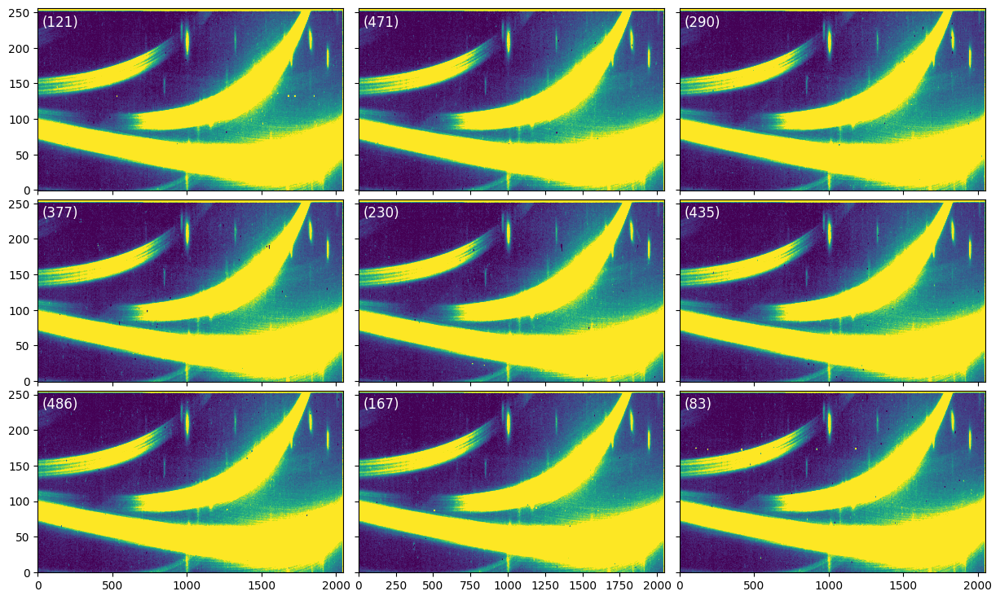

In [39]:
Image(filename=outdir_s2 + 'backgroundstep_1.png') 

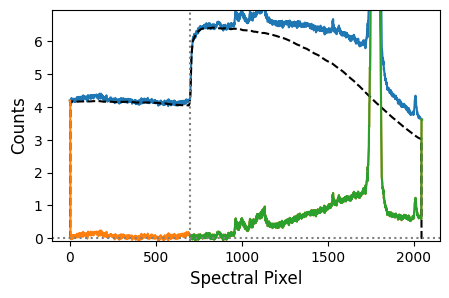

In [40]:
Image(filename=outdir_s2 + 'backgroundstep_2.png') 

<div class="alert alert-block alert-info"> <b>NOTE:</b> If doing the OneOverFStep at the integration level, this is where the step should be run. </div>

### Bad Pixel Correction Step
We are now going to interpolate any remaining bad pixels in the data to be ready for the spectral extraction.  

The BadPixStep performs two iterations of bad pixel detection and correction: the first is a spatial correction, and the second a temporal one. 

The spatial correction uses a median stack of all integrations to identify any pixels which are systematic outliers across the entire time series. These pixels are flagged, and then interpolate using a median of the surrounding pixels in each integration. Any pixels with DQ flags are also interpolated in this way. It will also produce and save a map of these hot pixels which are not already in the default DQ flags. 

The temporal flagging works the same way as the time-domain jump detection, by flagging any pixels which are outliers along the time axis, and replacing them with a median of the surrounding pixels in time. 

In [ ]:
step = stage2.BadPixStep(results, baseline_ints=[150, -100], output_dir=outdir_s2)

# We're going to use a 10 sigma threshold for both the spatial and temporal corrections.

results = step.run(save_results=True, force_redo=True, do_plot=True, space_thresh=10, time_thresh=10, 
                   window_size=9)

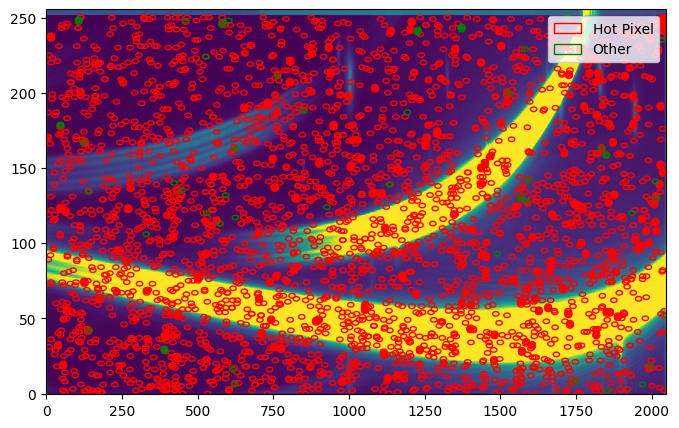

In [42]:
Image(filename=outdir_s2 + 'badpixstep.png') 

The diagnostic plot here shows the deep stack (median stack) with the locations of all hot and other flagged pixels. 

### PCA Reconstruction Step

This is the final step of Stage 2. The PCAReconstructStep uses principle component analysis (PCA) to deconstruct the timeseries into eigenimages that explain the largest amount of variance in the data, and their corresponding eigenvector timeseries. We then have the option to reconstruct the data, removing the components which correspond to detector "noise" (e.g., trace position drifts, tilt events, etc.). 

In [ ]:
step = stage2.PCAReconstructStep(results, baseline_ints=[150, -100], output_dir=outdir_s2)

# We're going to show the first 10 PCA components and also remove components 2, 3, and 4 which are correlated 
# with unwanted detector effects. 

results, deepframe = step.run(save_results=True, force_redo=True, do_plot=True, pca_components=10, 
                              remove_components=[2, 3, 4])

The first diagnostic plot is the intial results of the PCA. Here we see the eigenimages (right) and eigenvalue timeseries (left) of the 10 components that explain the most variance in the data. 

The first component is the transit white light curve itself. The next three components are due to detector-based trends. The second and third being caused by a slight sub-pixel drift in the position of the trace and the fourth being a beating pattern caused by JWST's thermal control system. All higher order components are noise.

So in this case, we want to remove components 2 -- 4 in the reconstruction, since these represent detector noise and not the astrophysical signal that we care about. 

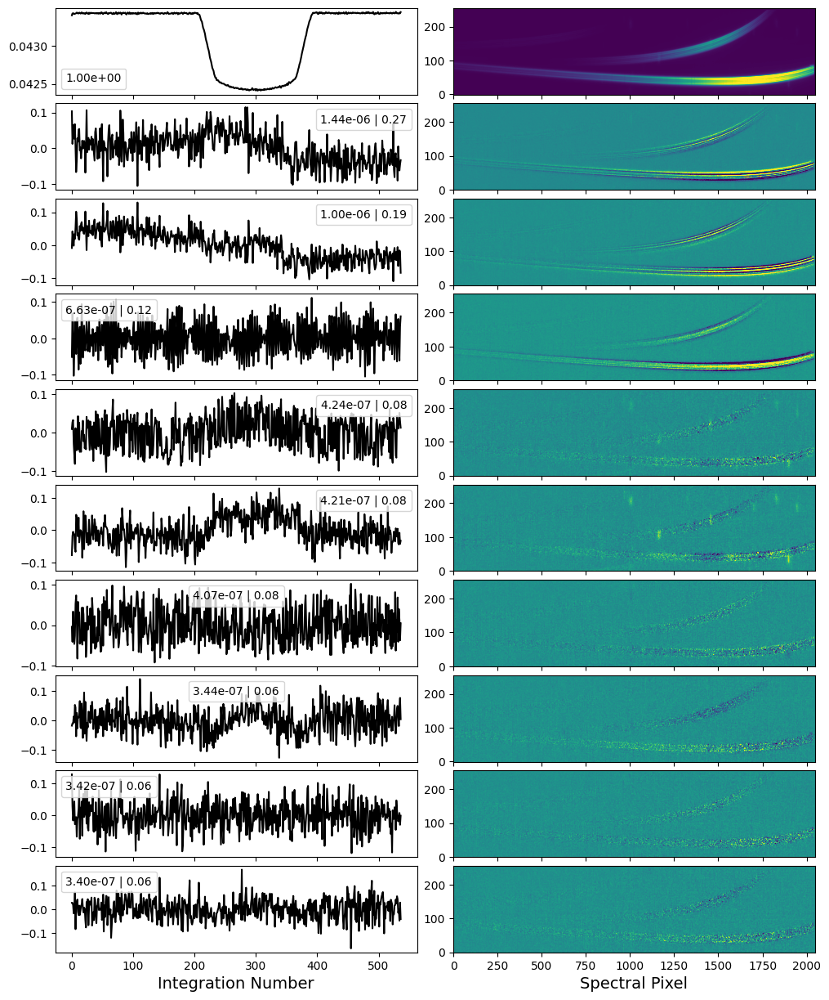

In [44]:
Image(filename=outdir_s2 + 'stability_pca.png') 

The second diagnostic plot shows the PCA results after the data reconstruction. We now see that the eigenimages that we wanted to remove are no longer present! 

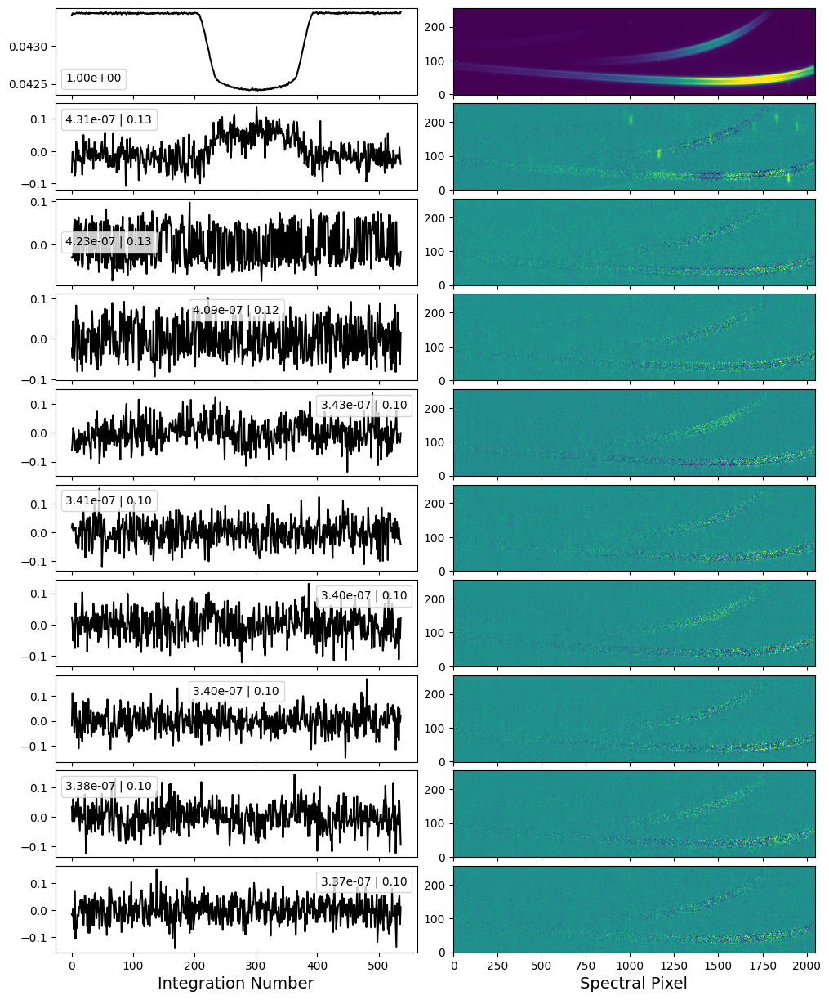

In [45]:
Image(filename=outdir_s2 + 'stability_pca_reconstructed.png') 

You'll note though that the second eigenimage after reconstruction still seems to show some weird structures. Namely, the so-called zeroth-order contaminants are picked out in the eigenimage, and the eigenvalue timeseries seems to trace the shape of the transit. This is due to the fact that although the spectral trace itself (and its expended wings which cover the majority of the SOSS frame) "see" the planet's transit, the contaminants do not since they are just background stars.  

A good plan of attack is to run this step first, passing ```remove_components=None``` to see the initial results. In this case, the step will simply return the input data with no reconstruction. You can then re run the step specifying the components that you identified as detector-related noise and want to remove. 

<div class="alert alert-block alert-info"> <b>WARNING:</b> Its important to be careful with the number of components being removed. Just like with high resolution cross correlation spectroscopy, removing components *can* have an effect on the final atmosphere spectrum. Only remove things that you *know* are detector correlated (positional drifts, beating patterns, etc.). If in doubt, compare your level of light curve scatter as well as the end atmosphere spectrum itself with and without the PCA removal. 
</div>

Everything looks good! We're now ready for Stage 3 and the spectral extraction.

## Stage 3 -- 1D Spectral Extraction

This is the shortest stage, as it just performs the 1D spectral extraction. 

In [ ]:
from exotedrf import stage3

# Let's now save outputs to the Stage 3 subdirectory. 

outdir_s3 = 'pipeline_outputs_directory/Stage3/'

There are three methods that one can use for the spectral extraction: a simple box aperture extraction, optimal extraction, or the ATOCA algorithm. The box aperture extraction is the easiest, simply place an aperture around the target trace and sum up the flux! 

Now, you probably noticed that the order 1 and order 2 traces partially overlap in the deep stakc image we made above. So a simple box aperture extraction will have some degree of self-contamination! It turns out for *relative measurements*, like transit observations, this effect is neglible for the vast majority of targets, so a box extraction is probably a safe bet. However, the ATOCA algorithm was developed to explicitly model and correct the SOSS self-contamination. If you're interested, the algorithm is detailed in [Darveau-Bernier et al. (2022)](https://ui.adsabs.harvard.edu/abs/2022PASP..134i4502D/abstract) and [Radica et al. (2022)](https://ui.adsabs.harvard.edu/abs/2022PASP..134j4502R/abstract).

In this case, we're simply going to go with the box aperture extraction for convenience. 

The Extract1DStep also will locate the positions of the stellar spectral trace on the detector using the the [edgetrigger algorithm](https://ui.adsabs.harvard.edu/abs/2022PASP..134j4502R/abstract) which was specifically deisgned to handle curved traces and overlapping spectral orders. The trace centroids will be saved as XXX_nis_centroids.csv. For this to work, we also need to pass the deepframe that we created earlier.

In [ ]:
# We're passing the parameters of the WASP-39 host star in order to cross correlate the extracted stellar 
# spectrum with a PHOENIX model and improve the extracted wavelength solution.

step = stage3.Extract1DStep(results, extract_method='box', output_dir=outdir_s3, 
                            st_teff=5485, st_logg=4.453, st_met=0.01)

# Here, we're using an aperture width of 30 pixels. 
# We also pass the deep framne from above.
# Note that if, for whatever reason, you want to specify your own trace positions, you can pass a custom 
# centroids file to the centroids keyword.

results = step.run(extract_width=30, deepframe=deepframe, save_results=True, force_redo=True, do_plot=True)

Depending on the extraction method, at least one plot will be made showing the location of the extraction aperture used. Let's look at that now.

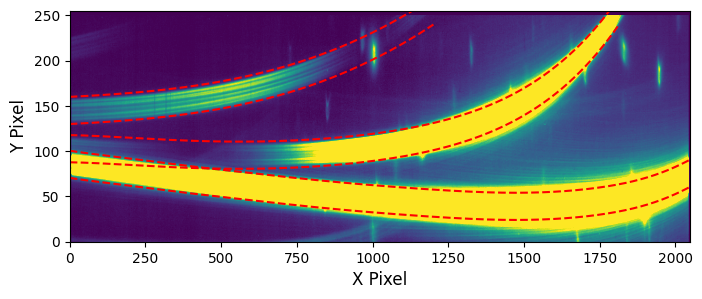

In [48]:
Image(filename=outdir_s3 + 'centroiding.png') 

*Tada!* You now have stellar spectra of WASP-39! Let's take a quick look at the wavelength-dependent light curves.

In [ ]:
# Open the extracted spectrum file and get the relevant quantities.

with fits.open(outdir_s3 + 'WASP-39_box_spectra_fullres.fits') as spec:
    
    wave1 = spec[1].data[5:-5]  # Order 1 wavelengths
    wave2 = spec[5].data  # Order 2 wavelengths
    
    order1 = spec[3].data[:, 5:-5]  # Order 1 spectra
    order2 = spec[7].data  # Order 2 spectra
    
base = np.concatenate([np.arange(150), np.arange(100)-100]).astype(int) # Baseline ints
    
# Normalize the extracted spectra.  

order1_norm = order1 / np.nanmedian(order1[base], axis=0)
order2_norm = order2 / np.nanmedian(order2[base], axis=0)

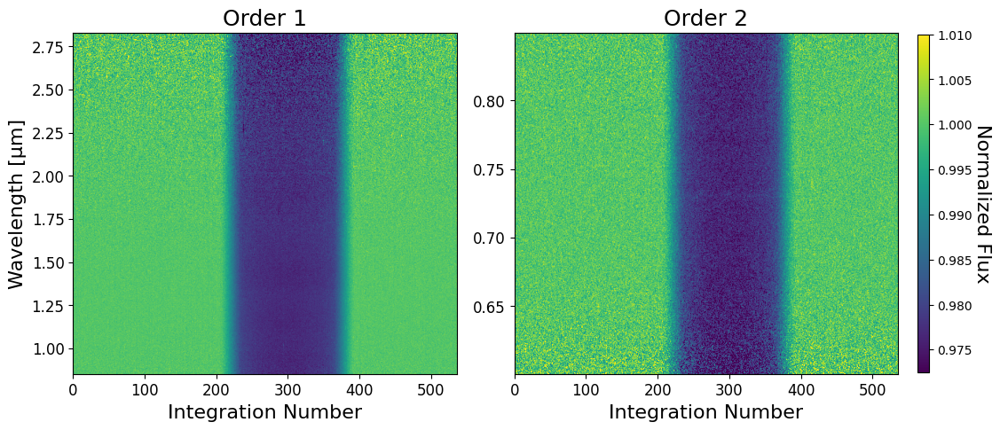

In [50]:
from exotedrf.plotting import make_2d_lightcurve_plot

# For order 2, only the wavelengths from 0.6 -- 0.85µm are useable.

ii = np.where((wave2 >= 0.6) & (wave2 < 0.85))[0]

# Display the light curves.

kwargs = {'vmin': 0.9725, 'vmax': 1.01}
make_2d_lightcurve_plot(wave1, order1_norm, wave2[ii], order2_norm[:, ii], **kwargs)

Look at how clean those are!  

If you look closely, you can notice the blues are darker, that is the transits are deeper, around 1.2, 1.4, and 1.8µm. Those are prominant water absorption bands; you can literally see the water absorption in the light curves! This is transit spectroscopy, *by eye!!* How cool is that?

exoTEDRF Stages 1 to 3 can also be run in script form via the provided run_DMS.py file. Simply fill out the corresponding yaml file with all relevant inputs, and you're good to go! Generally, I like to take a first pass at the data in a notebook, where I can double check the outputs of each step, and perhaps dig a bit deeper into some interesting things that pop up. I'll then use the script for the second pass.

You're now ready to fit some light curves and get your atmosphere spectrum, which is what you really want in the end, isn't it?!